# Final Project PCA Testing

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from scipy.optimize import minimize
import sklearn.linear_model as lm
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (4, 4)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['lines.linewidth'] = 3
sns.set()

## Breast Cancer Analysis

In [4]:
df = pd.read_csv("data.csv")

In [5]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [6]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

Remove Unnamed column and worst/standard error measurements

In [8]:
df_means = df.drop(columns=['Unnamed: 32', 'radius_se', 'texture_se', 'perimeter_se',
                      'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
                      'concave points_se', 'symmetry_se', 'fractal_dimension_se', 
                      'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 
                      'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 
                      'symmetry_worst', 'fractal_dimension_worst'])
df_means

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883
...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016


Change diagnosis column to 1s and 0s for malignant and benign, respectively

In [10]:
# diagnosis column
df_means['diagnosis'] = np.where(df_means['diagnosis'] == 'M', 1, 0)
df_means

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883
...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016


## Check distribution of data

### Plotting histograms of each feature

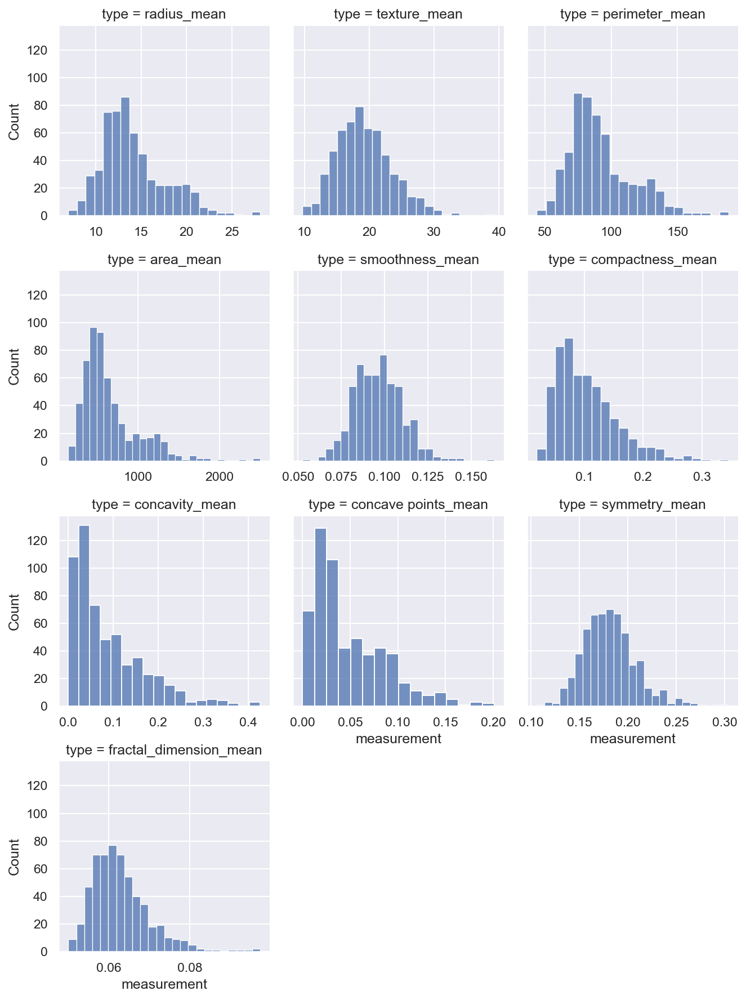

In [13]:
measurements_long = (
    df_means
    .drop(columns = ['diagnosis', 'id'])
    .melt(var_name='type', value_name='measurement')
)

measurements_grid = sns.FacetGrid(
    data = measurements_long,
    col = 'type',
    col_wrap = 3,
    sharex = False
)

measurements_grid.map(sns.histplot, 'measurement');

Some of the features have skewed data!

### Trying to remove outliers

Removing rows that contain values that are more than 3 standard deviations from the mean

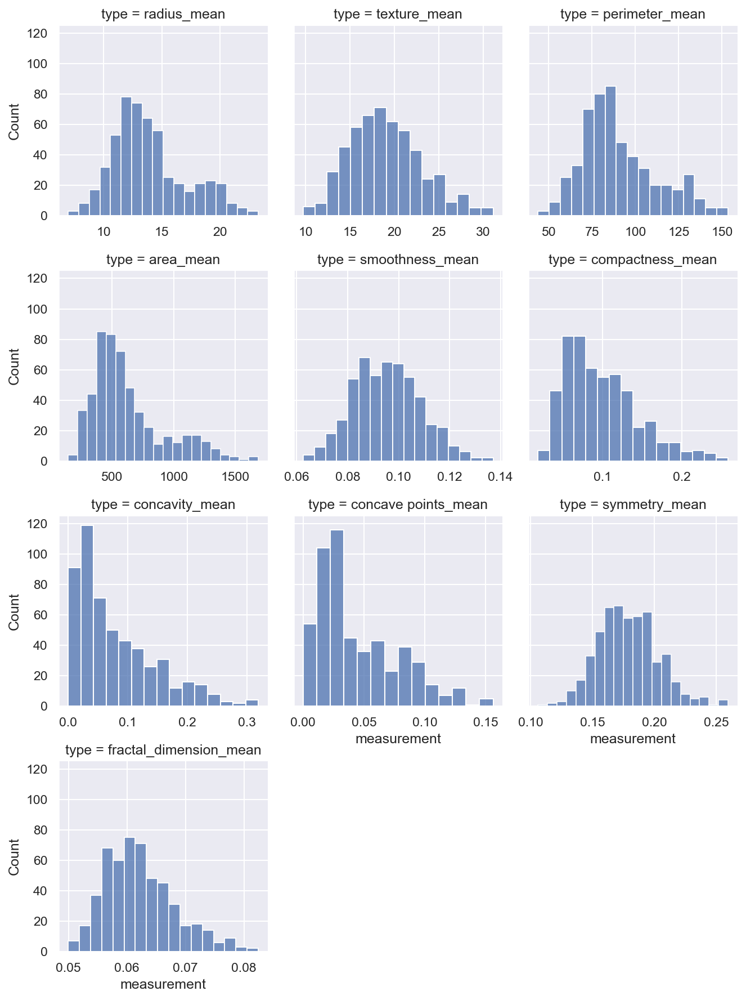

In [17]:

df_means = df_means[(np.abs(stats.zscore(df_means)) < 3).all(axis=1)]

df_means
measurements_long = (
    df_means
    .drop(columns = ['diagnosis', 'id'])
    .melt(var_name='type', value_name='measurement')
)

measurements_grid = sns.FacetGrid(
    data = measurements_long,
    col = 'type',
    col_wrap = 3,
    sharex = False
)

measurements_grid.map(sns.histplot, 'measurement');


In [18]:
df_means.shape

(528, 12)

41 rows were removed from the dataset, and the distributions are more symmetric, but concavity and concavity points are still skewed to the right.

### Correlation Plot

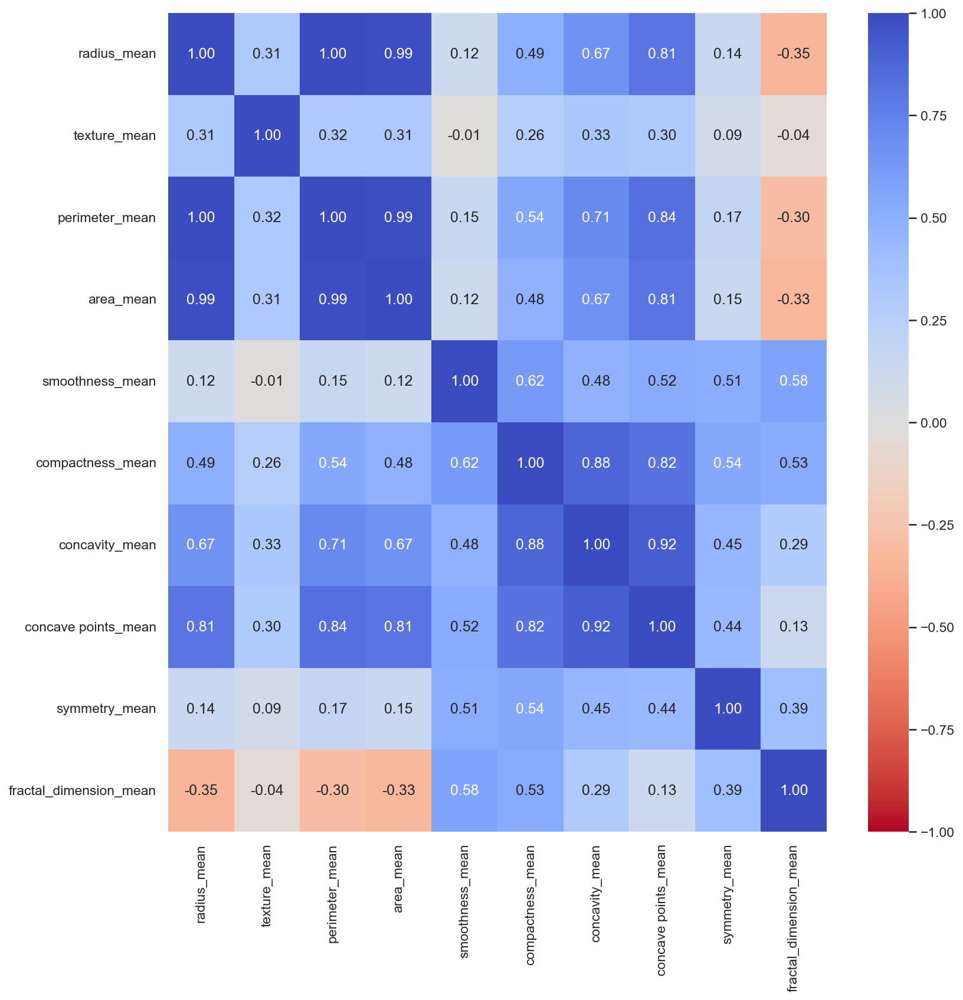

In [21]:
plt.figure(figsize = (12, 12))
sns.heatmap(
    df_means.drop(columns = ['diagnosis', 'id']).corr(),
    annot = True,
    fmt = '.2f',
    cmap = 'coolwarm_r',
    vmin = -1, 
    vmax = 1
);

## Scatterplot Matrix

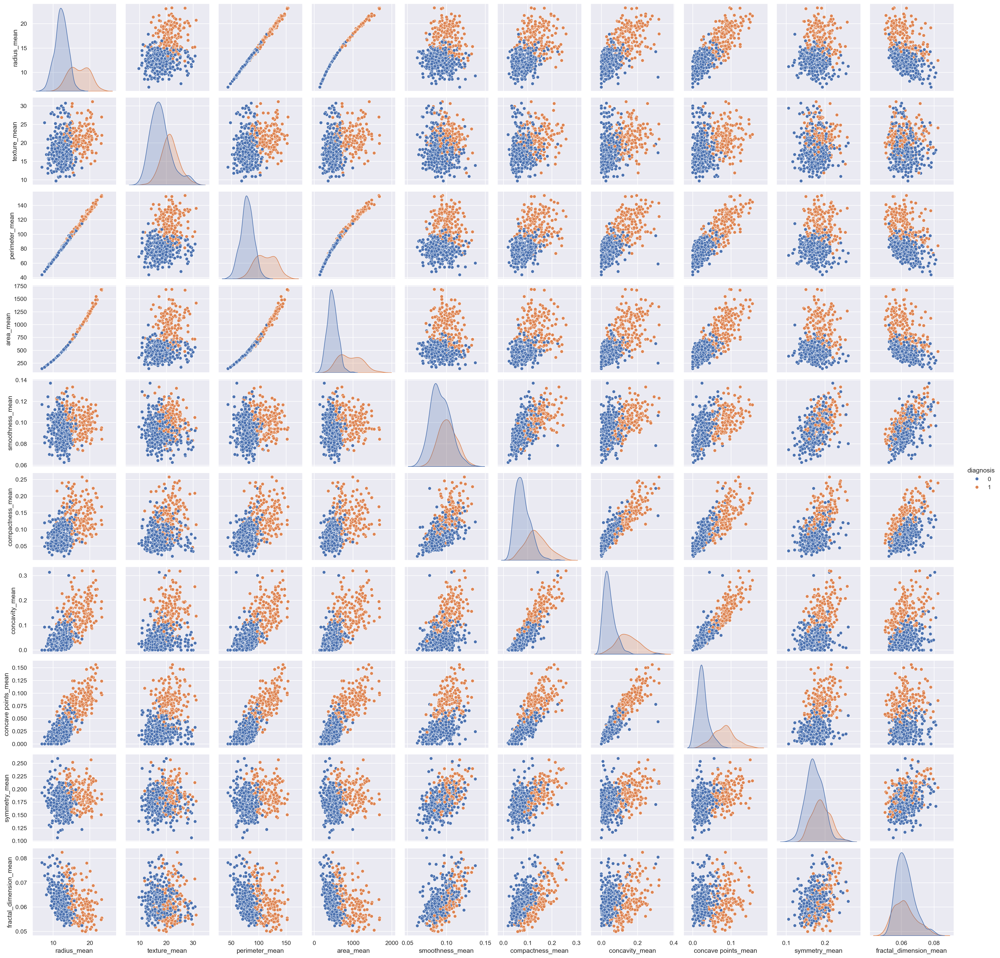

In [23]:
sns.pairplot(
    df_means.drop(columns = 'id'),
    hue = 'diagnosis'
);

## Test for the KMO score

Measuring overall correlation of data

In [26]:
!pip install factor_analyzer 
from factor_analyzer import calculate_kmo

feat_kmo, overall_kmo = calculate_kmo(df_means.drop(columns = ['diagnosis', 'id']))

print(f'The overall KMO score for the breast cancer data is{overall_kmo: .2f}')

The overall KMO score for the breast cancer data is 0.79


the KMO score is 0.79, which is fine

Source for legend label reordering: https://www.geeksforgeeks.org/how-to-change-order-of-items-in-matplotlib-legend/

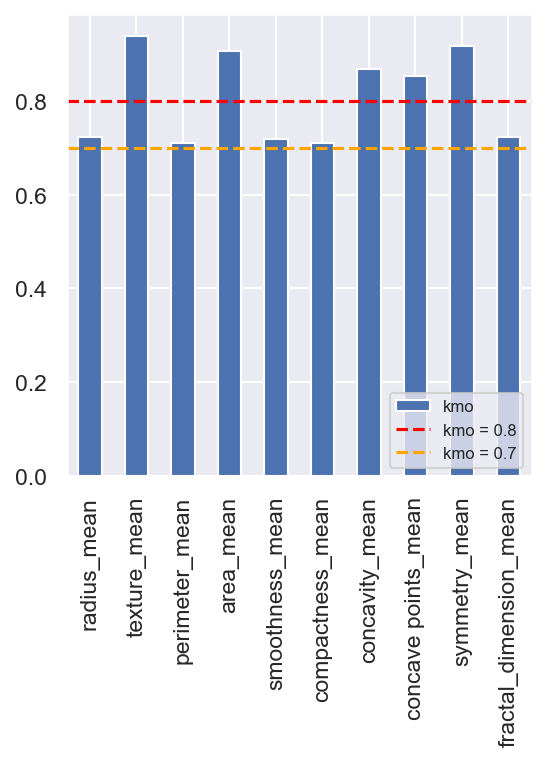

In [29]:
pd.DataFrame(
    {'kmo': feat_kmo},
    index = df_means.drop(columns = ['diagnosis', 'id']).columns
).plot(kind = 'bar')

plt.axhline(0.8, color = 'red', linestyle = '--', label = 'kmo = 0.8');
plt.axhline(0.7, color = 'orange', linestyle = '--', label = 'kmo = 0.7');

# reordering the labels 
handles, labels = plt.gca().get_legend_handles_labels() 
  
# specify order 
order = [2, 0, 1] 
  
# pass handle & labels lists along with order as below 
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc = 4, fontsize = 8)
plt.show()

5 of the features have a KMO score above 0.8, and the remaining 5 features have a KMO score above 0.7. This is not the most ideal, but it is still acceptable for PCA.

### Standardizing Data

In [32]:
from sklearn.preprocessing import StandardScaler

# Array of standardized values
df_scaler = StandardScaler()
df_scaler.fit_transform(df_means.drop(columns = ['diagnosis', 'id']))


# Converting bones_stan to a dataframe
df_means_stan = pd.DataFrame(
    df_scaler.transform(df_means.drop(columns = ['diagnosis', 'id'])),
    # Adding the column names back
    #columns = bones_full.drop(columns = 'sex').columns
    columns = df_scaler.feature_names_in_
)

df_means_stan

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,2.115922,-0.328648,1.975090,2.333018,-0.825531,-0.447114,0.099551,0.737031,0.088255,-0.930229
1,1.835518,0.526669,1.840086,1.920671,1.080428,1.335068,1.737854,2.444857,1.142282,-0.379643
2,2.026702,-1.171675,2.077506,2.235798,0.367418,0.740714,1.746750,1.746699,0.075951,-0.572016
3,-0.471443,-0.837413,-0.367928,-0.512846,2.475780,1.556579,1.150734,1.054161,1.216105,2.297001
4,1.376675,0.214527,1.355933,1.374227,-0.067288,0.218737,0.482069,0.850334,0.014432,-0.805850
...,...,...,...,...,...,...,...,...,...,...
523,0.411192,2.829632,0.601773,0.291063,0.712423,2.405342,2.591847,1.450573,1.384258,1.532483
524,2.227446,1.470466,2.445276,2.403418,1.103428,2.732126,3.517006,3.021725,1.470384,1.079742
525,2.431376,0.806858,2.398723,2.845937,1.187762,0.370066,2.427276,2.770270,-0.264454,-1.003198
526,1.975720,2.247132,1.895949,2.115111,0.175749,0.095918,0.946131,1.557663,-0.157821,-1.152453


In [33]:

pd.DataFrame({
    'feature means': df_means_stan.mean().round(4),
    'feature variances': df_means_stan.var(ddof = 0).round(4)
})

,feature means,feature variances
radius_mean,0.0,1.0
texture_mean,-0.0,1.0
perimeter_mean,0.0,1.0
area_mean,0.0,1.0
smoothness_mean,-0.0,1.0
compactness_mean,-0.0,1.0
concavity_mean,0.0,1.0
concave points_mean,0.0,1.0
symmetry_mean,0.0,1.0
fractal_dimension_mean,-0.0,1.0


## PCA

In [35]:
from sklearn.decomposition import PCA

# Performing PCA
df_means_pca = PCA()  # Fitting all of the components
df_means_pca.fit_transform(df_means_stan)

array([[ 2.35625267e+00, -2.80148657e+00, -1.05132423e+00, ...,
         6.25498357e-02,  6.18016455e-02,  2.14918253e-02],
       [ 4.82548906e+00, -3.79218807e-01, -4.18281024e-01, ...,
        -3.37347594e-01,  7.82958748e-02,  2.05228560e-02],
       [ 3.95260925e+00, -1.40961161e+00, -1.95671382e+00, ...,
         2.19148680e-01,  8.53255776e-02, -4.60853184e-02],
       ...,
       [ 5.43029747e+00, -2.00019353e+00, -4.82878430e-01, ...,
         7.94567726e-02,  1.70968524e-01, -3.08654549e-03],
       [ 3.64205569e+00, -2.42447620e+00,  1.24560605e+00, ...,
        -8.86593563e-02,  4.25990794e-02,  1.57399980e-02],
       [ 1.09905511e+00, -2.08293997e+00,  1.88579875e+00, ...,
        -2.32744797e-02, -3.81372533e-02, -1.22594857e-03]])

In [36]:
# Calculates the PCs for the supplied data set and save it as a DF
z_df_means = pd.DataFrame(
    df_means_pca.transform(df_means_stan),
    # Adding which PC it is: Need a loop to create the list of PC1 to PC13
    columns = ['PC' + str(i) for i in np.arange(1, df_means_stan.shape[1]+1)]
)

z_df_means

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,2.356253,-2.801487,-1.051324,0.501406,0.246871,1.085914,0.481088,0.062550,0.061802,0.021492
1,4.825489,-0.379219,-0.418281,0.408033,-0.304780,-0.296841,0.213456,-0.337348,0.078296,0.020523
2,3.952609,-1.409612,-1.956714,-0.373629,0.319613,-0.064454,0.414360,0.219149,0.085326,-0.046085
3,1.667331,3.903982,-0.812933,-0.492397,-0.322256,-0.097650,0.144520,-0.059634,-0.050476,0.011795
4,2.162628,-1.562675,-0.359880,0.142964,-0.137904,0.190561,0.032240,-0.013671,-0.013949,-0.011424
...,...,...,...,...,...,...,...,...,...,...
523,3.950246,2.052244,2.703385,-0.155644,0.687534,-0.558632,-0.085851,0.227520,-0.097689,-0.018705
524,7.121197,0.687772,0.591416,-0.335880,0.728078,-0.186368,0.389226,0.143009,0.037177,-0.066714
525,5.430297,-2.000194,-0.482878,-0.584544,-0.962120,-0.575531,1.117917,0.079457,0.170969,-0.003087
526,3.642056,-2.424476,1.245606,0.121385,-0.904763,0.117576,0.429822,-0.088659,0.042599,0.015740


### Visualizing Principal Components

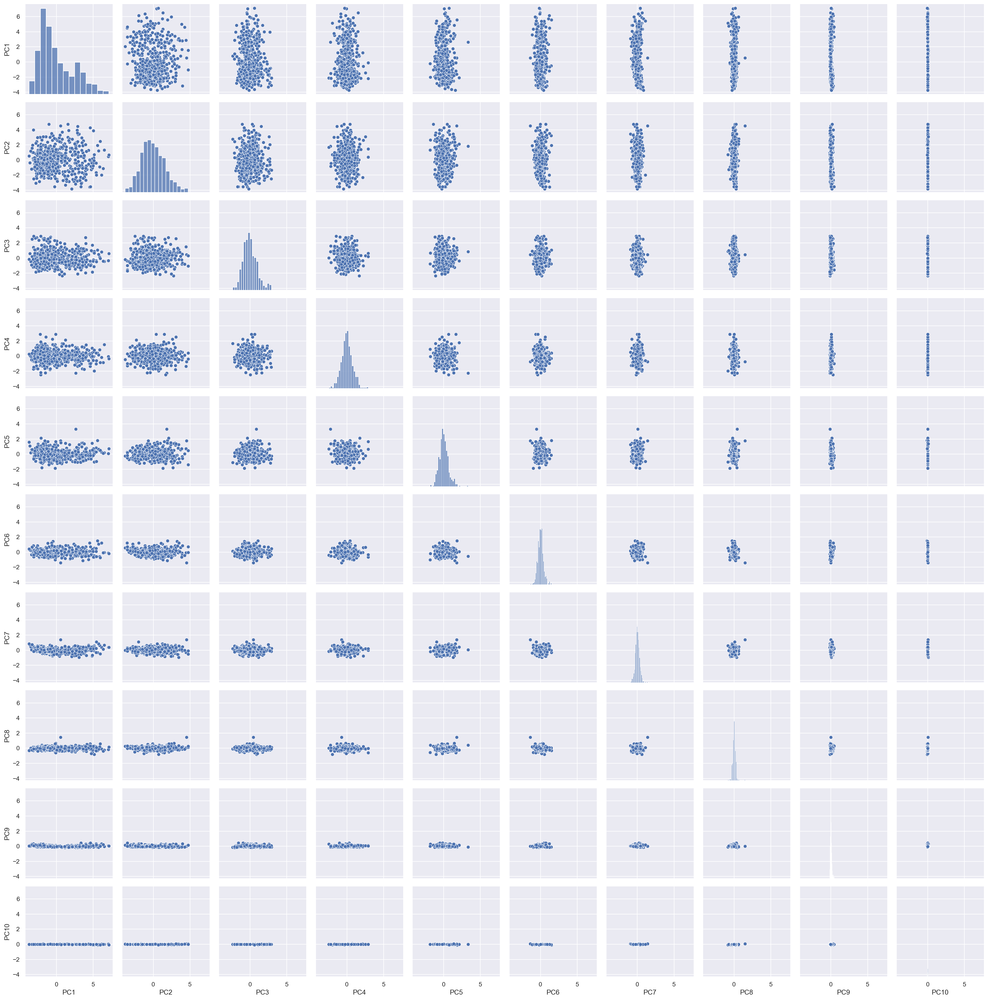

In [38]:
df_means_pairplot = sns.pairplot(z_df_means)

# Forcing each plot to have the same range on the x & y axis
for i, ax_row in enumerate(df_means_pairplot.axes):
    for j, ax in enumerate(ax_row):
        if ax is not None:
            # Get the current x and y limits
            xlim = ax.get_xlim()
            ylim = ax.get_ylim()

            # Find the common limit range
            min_lim = min(xlim[0], ylim[0])
            max_lim = max(xlim[1], ylim[1])

            # Set both limits to the same range
            ax.set_xlim(min_lim, max_lim)
            ax.set_ylim(min_lim, max_lim);

In [39]:
# Adding diagnosis back
z_df_means['diagnosis'] = df_means.reset_index()['diagnosis']

z_df_means

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,diagnosis
0,2.356253,-2.801487,-1.051324,0.501406,0.246871,1.085914,0.481088,0.062550,0.061802,0.021492,1
1,4.825489,-0.379219,-0.418281,0.408033,-0.304780,-0.296841,0.213456,-0.337348,0.078296,0.020523,1
2,3.952609,-1.409612,-1.956714,-0.373629,0.319613,-0.064454,0.414360,0.219149,0.085326,-0.046085,1
3,1.667331,3.903982,-0.812933,-0.492397,-0.322256,-0.097650,0.144520,-0.059634,-0.050476,0.011795,1
4,2.162628,-1.562675,-0.359880,0.142964,-0.137904,0.190561,0.032240,-0.013671,-0.013949,-0.011424,1
...,...,...,...,...,...,...,...,...,...,...,...
523,3.950246,2.052244,2.703385,-0.155644,0.687534,-0.558632,-0.085851,0.227520,-0.097689,-0.018705,1
524,7.121197,0.687772,0.591416,-0.335880,0.728078,-0.186368,0.389226,0.143009,0.037177,-0.066714,1
525,5.430297,-2.000194,-0.482878,-0.584544,-0.962120,-0.575531,1.117917,0.079457,0.170969,-0.003087,1
526,3.642056,-2.424476,1.245606,0.121385,-0.904763,0.117576,0.429822,-0.088659,0.042599,0.015740,1


## Determine \# of PCs to keep

### Get eigenvalues

In [42]:
eigvals = df_means_pca.explained_variance_.round(3)
eigvals

array([5.362, 2.509, 0.895, 0.586, 0.385, 0.149, 0.086, 0.038, 0.008,
       0.   ])

### Check variance retained by each PC

In [44]:
# Calculating the individual percentage of variance retained
eigval_df = pd.DataFrame({
    'PC Num': np.arange(len(eigvals)) + 1,
    'eigenvalue': eigvals,
    'variance explained':  eigvals / eigvals.sum(),
    'cumulative variance': np.cumsum(eigvals) / eigvals.sum()
})

eigval_df.round(3)

,PC Num,eigenvalue,variance explained,cumulative variance
0,1,5.362,0.535,0.535
1,2,2.509,0.250,0.786
2,3,0.895,0.089,0.875
3,4,0.586,0.058,0.934
4,5,0.385,0.038,0.972
5,6,0.149,0.015,0.987
6,7,0.086,0.009,0.995
7,8,0.038,0.004,0.999
8,9,0.008,0.001,1.000
9,10,0.000,0.000,1.000


If we want to retain 70% of the info then we need the first 2 PCs, which will retain 78.5% of the original info.

If we want to retain 80% of the info then we need the first 3 PCs, which will retain 87.4% of the original info.

If we want to retain 90% of the info then we need the first 4 PCs, which will retain 93.2% of the original info.

### Make a Scree Plot

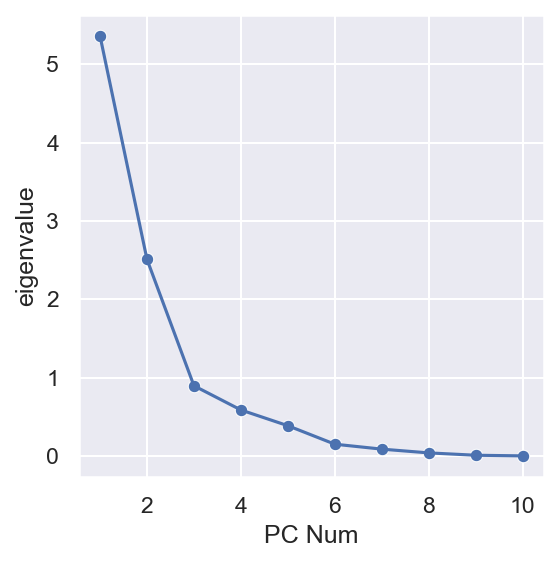

In [47]:
# Creating a scree plot
sns.lineplot(
    data = eigval_df,
    x = 'PC Num',
    y = 'eigenvalue'
)

sns.scatterplot(
    data = eigval_df,
    x = 'PC Num',
    y = 'eigenvalue'
)

plt.grid(True);

There are significant decreases between PCs 1 and 2, and PCs 2 and 3, and after that the decreases are less significant.
Let's look at the first 2 PCs.

### Visualize the data

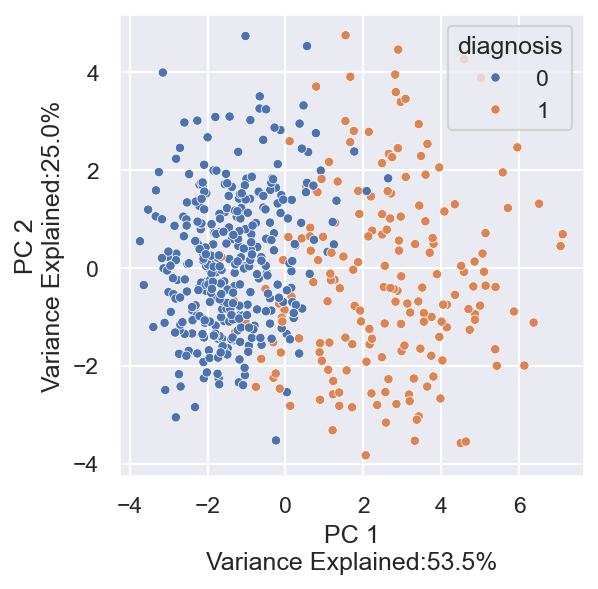

In [50]:
sns.scatterplot(
    data = z_df_means,
    x = 'PC1',
    y = 'PC2',
    hue = 'diagnosis',
    s = 20
)

pc_var_exp = (df_means_pca.explained_variance_ / sum(df_means_pca.explained_variance_)).round(3) * 100

plt.xlabel(f'PC 1\nVariance Explained:{str(pc_var_exp[0]) + '%'}')
plt.ylabel(f'PC 2\nVariance Explained:{str(pc_var_exp[1].round(1)) + '%'}');

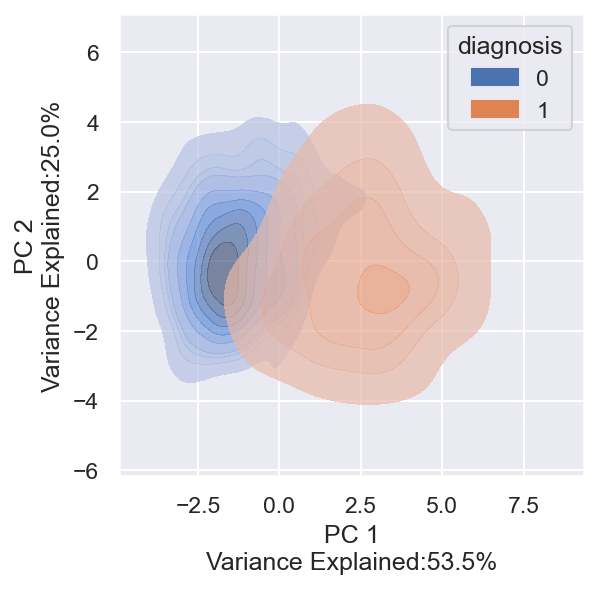

In [51]:
sns.kdeplot(
    data = z_df_means,
    x = 'PC1',
    y = 'PC2',
    hue = 'diagnosis',
    fill=True,
    alpha = 0.7
)


plt.xlabel(f'PC 1\nVariance Explained:{str(pc_var_exp[0]) + '%'}')
plt.ylabel(f'PC 2\nVariance Explained:{str(pc_var_exp[1].round(1)) + '%'}');

### Calculate percentage of explained variation

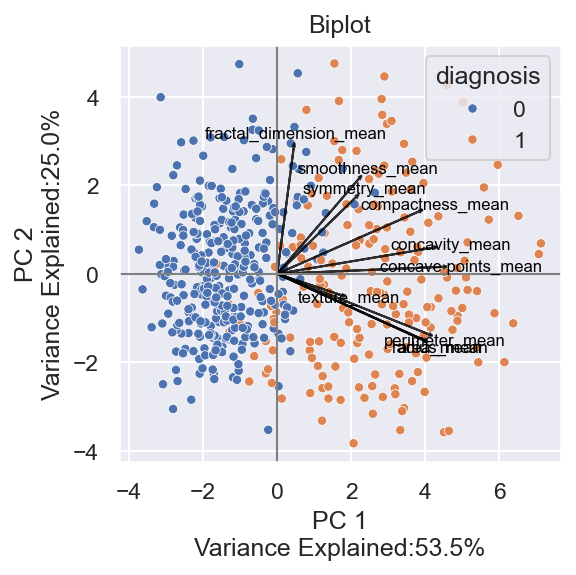

In [53]:
pc_var_exp = (df_means_pca.explained_variance_ / sum(df_means_pca.explained_variance_)).round(3) * 100

# Specifying the PCs to plot
PC_x = 1
PC_y = 2


# Biplot (again)
sns.scatterplot(
    data = z_df_means,
    x = 'PC' + str(PC_x),
    y = 'PC' + str(PC_y),
    hue = 'diagnosis',
    s = 20
)


# Adding arrows and text for each original feature
for i, var in enumerate(df_means_stan.columns):
    plt.arrow(0, 0, 
              df_means_pca.components_[PC_x - 1, i] * 2 * df_means_pca.explained_variance_[PC_x - 1], 
              df_means_pca.components_[PC_y - 1, i] * 2 * df_means_pca.explained_variance_[PC_y - 1], 
              color='black', alpha=0.8, head_width=0.05)
    
    plt.text(df_means_pca.components_[PC_x - 1, i] * 2.2 * df_means_pca.explained_variance_[PC_x - 1], 
             df_means_pca.components_[PC_y - 1, i] * 2.2 * df_means_pca.explained_variance_[PC_y - 1], 
             var, color='black', ha='center', va='center', fontsize = 8)


# Updating the x and y-axis labels
plt.xlabel(f'PC 1\nVariance Explained:{str(pc_var_exp[PC_x - 1]) + '%'}')
plt.ylabel(f'PC 2\nVariance Explained:{str(pc_var_exp[PC_y - 1].round(1)) + '%'}')


plt.title('Biplot')
plt.grid(True)
plt.axhline(0, color='grey', lw=1)
plt.axvline(0, color='grey', lw=1)
plt.tight_layout()
plt.show();

## Interpreting PCs

### Looking at components in first 3 PCs

In [56]:
PC_loadings = pd.DataFrame(
    df_means_pca.components_,
    index = ['PC' + str(i + 1) for i in np.arange(df_means_stan.shape[1])],
    columns = df_means_stan.columns
)

PC_loadings.iloc[0:3, :].round(3)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
PC1,0.373,0.165,0.384,0.372,0.208,0.360,0.396,0.420,0.200,0.042
PC2,-0.303,-0.098,-0.274,-0.300,0.432,0.283,0.119,0.032,0.348,0.575
PC3,-0.117,0.950,-0.107,-0.108,-0.188,0.053,0.049,-0.075,-0.023,0.116


### Make a Heatmap for easier viewing

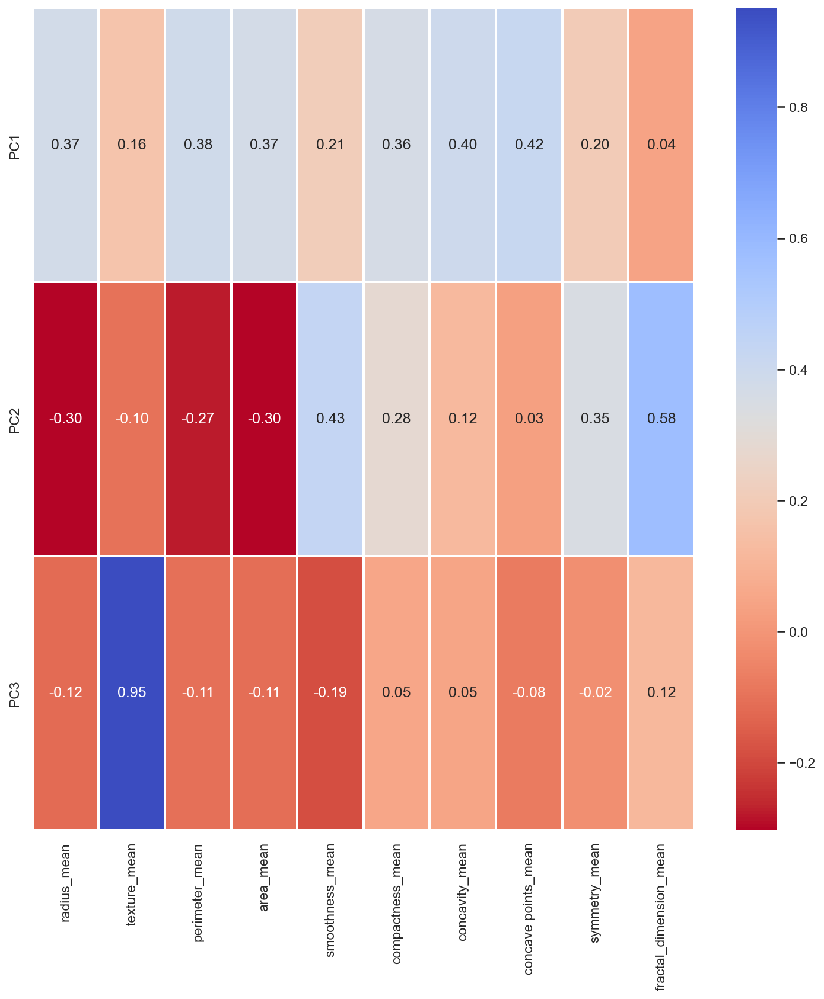

In [58]:
plt.figure(figsize = (12, 12))
sns.heatmap(
    data = PC_loadings.iloc[0:3, :],
    annot = True,
    fmt = '.2f',
    cmap = 'coolwarm_r',
    linewidths = 1,
    linecolor = 'white'
);

Unfortunately we do not have a lot of very strong correlations

**PC1** appears to be the total size and concavity of the cells

**PC2** appears to be difference between (fractal dimension + smoothness) and total cell size (radius + perimeter + area)

**PC3** is the texture of the cell

## Testing with Logistic Regression to see if this is useful

### Train-Test-Split

In [62]:
# series of training index rows
train_set = pd.Series(np.arange(0, len(z_df_means))).sample(round(0.75*len(z_df_means)), random_state = 3870)

## The two training sets:
# X features and PCs
df_means_train = df_means_stan.reset_index(drop = True).iloc[train_set]#.drop(columns = 'sex')
pc_train = z_df_means.reset_index(drop = True).iloc[train_set].drop(columns = 'diagnosis')

# Response
y_train = df_means.reset_index(drop = True).iloc[train_set]['diagnosis']

## The two testing sets
# X features and PCs
df_means_test = df_means_stan.reset_index(drop = True).drop(index = train_set)#, columns = 'sex')
pc_test = z_df_means.reset_index(drop = True).drop(index = train_set, columns = 'diagnosis')

# Response
y_test = df_means.reset_index(drop = True).drop(index = train_set)['diagnosis']

y_train, y_test

(452    0
 351    0
 78     1
 160    0
 511    0
       ..
 153    1
 126    0
 504    0
 296    0
 260    0
 Name: diagnosis, Length: 396, dtype: int32,
 1      1
 5      1
 9      1
 14     1
 19     0
       ..
 517    0
 518    0
 519    0
 522    0
 527    1
 Name: diagnosis, Length: 132, dtype: int32)

### Original Data

In [64]:
from sklearn.linear_model import LogisticRegression

df_means_logit = (
    LogisticRegression(penalty = None)   # No regularization
    .fit(df_means_train, y_train)
)

full_acc = df_means_logit.score(df_means_test, y_test)

### All PCs

In [66]:
PCs_logit_full = (
    LogisticRegression(penalty = None)   # No regularization
    .fit(pc_train, y_train)
)

pc_full_acc = PCs_logit_full.score(
    pc_test, 
    y_test
)

### Three PCs

In [68]:
PC2_logit = (
    LogisticRegression(penalty = None)   # No regularization
    .fit(pc_train[['PC1', 'PC2', 'PC3']], y_train)
)

pc2_acc = PC2_logit.score(pc_test[['PC1', 'PC2', 'PC3']], y_test)

### Compare!

In [70]:
pd.DataFrame([{
    '10 Features': round(full_acc, 3),
    '10 PCs': round(pc_full_acc, 3),
    '3 PCs': round(pc2_acc, 3)
}])

,10 Features,10 PCs,3 PCs
0,0.947,0.947,0.932


Using 3 PCs decreases the accuracy by a little bit, but it's still pretty good!!

## Testing PCs with Classification Tree

### Original Data

In [74]:
from sklearn import tree, ensemble
# Fitting the tree to the data
full_tree = (
    tree.DecisionTreeClassifier(criterion = 'gini', random_state = 3870)
    .fit(df_means_train, y_train)
)
full_tree_acc = full_tree.score(df_means_test, y_test)

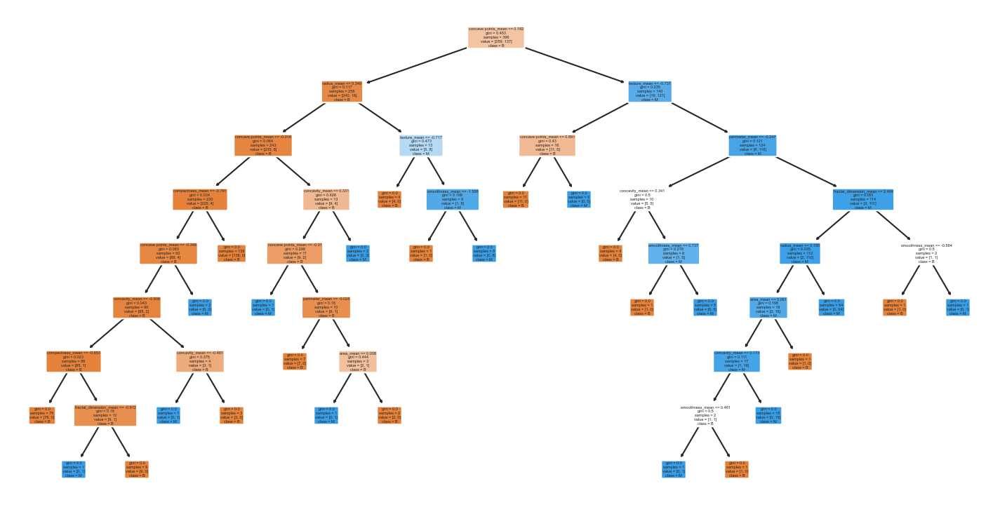

In [75]:
# Plotting the tree
plt.figure(figsize = [12, 6])
tree.plot_tree(
    full_tree, # Model
    feature_names = ['radius_mean', 'texture_mean', 'perimeter_mean',
                      'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
                      'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'],
    class_names = np.unique(np.where(y_train == 1, 'M', 'B')),
    filled = True,
    rounded = True
)
plt.show()

### All PCs

In [77]:
from sklearn import tree, ensemble
# Fitting the tree to the data
pcs_tree = (
    tree.DecisionTreeClassifier(criterion = 'gini', random_state = 3870)
    .fit(pc_train, y_train)
)
pcs_tree_acc = pcs_tree.score(
    pc_test, 
    y_test
)

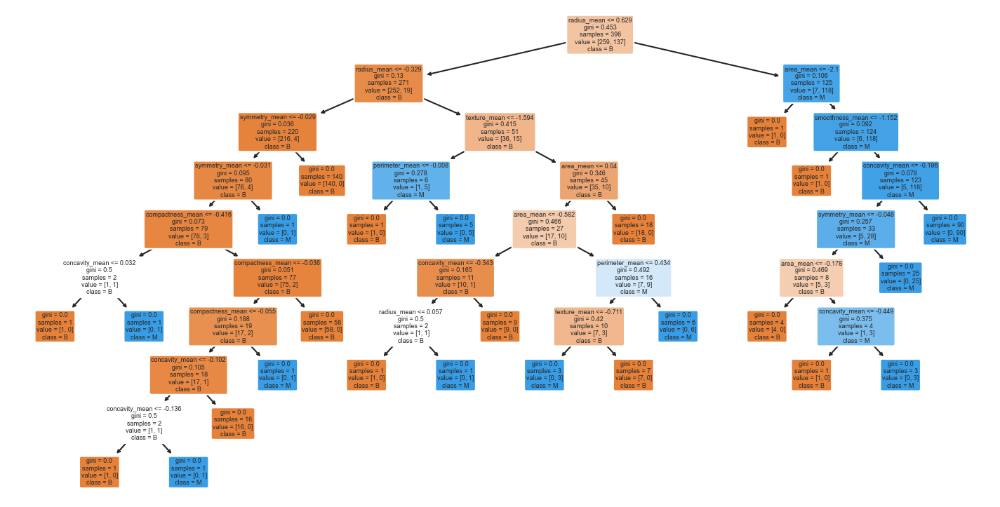

In [78]:
# Plotting the tree
plt.figure(figsize = [12, 6])
tree.plot_tree(
    pcs_tree, # Model
    feature_names = ['radius_mean', 'texture_mean', 'perimeter_mean',
                      'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
                      'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'],
    class_names = np.unique(np.where(y_train == 1, 'M', 'B')),
    filled = True,
    rounded = True
)
plt.show()

### Three PCs

In [80]:
from sklearn import tree, ensemble
# Fitting the tree to the data
pc3_tree = (
    tree.DecisionTreeClassifier(criterion = 'gini', random_state = 3870)
    .fit(pc_train[['PC1', 'PC2', 'PC3']], y_train)
)

pc3_tree_acc = pc3_tree.score(pc_test[['PC1', 'PC2', 'PC3']], y_test)

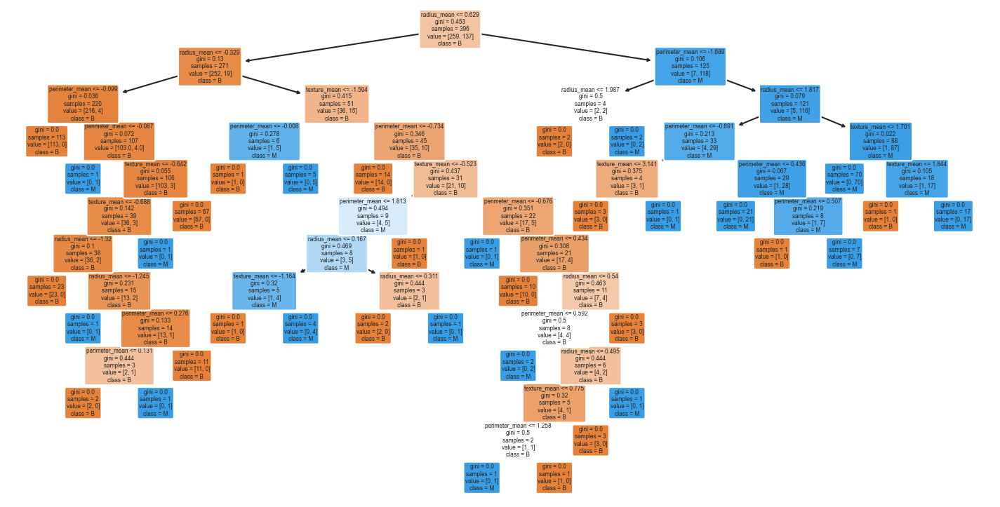

In [81]:
# Plotting the tree
plt.figure(figsize = [12, 6])
tree.plot_tree(
    pc3_tree, # Model
    feature_names = ['radius_mean', 'texture_mean', 'perimeter_mean',
                      'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
                      'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'],
    class_names = np.unique(np.where(y_train == 1, 'M', 'B')),
    filled = True,
    rounded = True
)
plt.show()

In [82]:
pd.DataFrame([{
    '10 Features': round(full_tree_acc, 3),
    '10 PCs': round(pcs_tree_acc, 3),
    '3 PCs': round(pc3_tree_acc, 3)
}])

,10 Features,10 PCs,3 PCs
0,0.947,0.917,0.924


Accuracy of 3 PCs is a bit smaller than when using the 10 original features, but it is higher than using all 10 PCs.